# Basics of Single Time-Series
## Comparison of Traditional TS to Prophet
Reza Rashetnia July-2020

This Kernel developed and derived from one of my solved Kaggle competitions. The objective is to overview a single time series forecast general steps.

### Time Series forecasting: 
The act of predicting the future by understanding the past.
### Time Series Components:
* __Level__: The baseline value for the series if it were a straight line
* __Trend__: The general tendency of a time series to increase, decrease or stagnate over a long period of time
* __Seasonal__: Fluctuations within a year during the season. The important factors causing seasonal variations are climate and weather conditions, customs, traditional habits, etc.
  * Seasonality refers to the property of a time series that displays periodical patterns that repeats at a constant frequency (m). 
* __Cyclical__: describes the medium-term changes in the series, caused by circumstances, which repeat in cycles. The duration of a cycle extends over longer period of time, usually two or more years. For example a business cycle consists of four phases: 
        i) Prosperity
        ii) Decline
        iii) Depression
        iv) Recovery
        * Cycles are seasons that do not occur at a fixed rate.
* __Noise/irregular__: irregular or random variations in a time series are caused by unpredictable influences, which are not regular and also do not repeat in a particular pattern. These variations are caused by incidences such as war, strike, earthquake, flood, revolution, etc. There is no defined statistical technique for measuring random fluctuations in a time series.

### Additive vs. Multiplicative decomposition models:
When series contains trend, seasonality and noise, it is important to understand how they interact.
* Multiplicative model: Based on the assumption that four components of a time series are not necessarily independent and they can affect one another:
$$Y(t) = T(t) \times S(t) \times C(t) \times I(t)$$
* Additive model: To represent a time series as a combination of patterns at different scales such as daily, weekly, seasonally, and yearly, along with an overall trend:
$$Y(t) = T(t) + S(t) + C(t) + I(t)$$
_Decoposition_ is the deconstruction of the series data into its various components: trend, cycle, noise, and seasonal when those exist. Two types of decompositions are: __Additive__ and __Multiplicative__.

### Example: Total sales prediction for next month
This example is based on one of Kaggle competions. In this example we are provided with daily sales for each store-item combination of a Russian software company. Our task is to predict sales at a monthly level.
This example is solved in following steps:
* Package imports and data
* Basic Exploration/EDA
* Stationarity
* Seasonality , Trend and Remainder
* AR , MA , ARMA , ARIMA
* Selecting P and Q using AIC
* Prophet

In [48]:
# IMPORTS
# ---------------------------------------------------
# Basic Packages
import numpy as np
import pandas as pd
import random as rd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from math import sqrt
from sklearn.metrics import mean_squared_error
# ---------------------------------------------------
# Time Series
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, acf, pacf, arma_order_select_ic
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
# ---------------------------------------------------
# setting
import warnings
warnings.filterwarnings("ignore")

In [42]:
# Read the data
sales      = pd.read_csv("sales_train.csv")

In [3]:
sales.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day
0,02.01.2013,0,59,22154,999.00,1.0
1,03.01.2013,0,25,2552,899.00,1.0
2,05.01.2013,0,25,2552,899.00,-1.0
3,06.01.2013,0,25,2554,1709.05,1.0
4,15.01.2013,0,25,2555,1099.00,1.0


In [4]:
# Date must be corrected
print(sales.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2935849 entries, 0 to 2935848
Data columns (total 6 columns):
 #   Column          Dtype  
---  ------          -----  
 0   date            object 
 1   date_block_num  int64  
 2   shop_id         int64  
 3   item_id         int64  
 4   item_price      float64
 5   item_cnt_day    float64
dtypes: float64(2), int64(3), object(1)
memory usage: 134.4+ MB
None


In [5]:
#formatting the date column correctly
sales.date = sales.date.apply(lambda x:datetime.datetime.strptime(x,'%d.%m.%Y'))
# check
print(sales.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2935849 entries, 0 to 2935848
Data columns (total 6 columns):
 #   Column          Dtype         
---  ------          -----         
 0   date            datetime64[ns]
 1   date_block_num  int64         
 2   shop_id         int64         
 3   item_id         int64         
 4   item_price      float64       
 5   item_cnt_day    float64       
dtypes: datetime64[ns](1), float64(2), int64(3)
memory usage: 134.4 MB
None


In [6]:
sales.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day
0,2013-01-02,0,59,22154,999.00,1.0
1,2013-01-03,0,25,2552,899.00,1.0
2,2013-01-05,0,25,2552,899.00,-1.0
3,2013-01-06,0,25,2554,1709.05,1.0
4,2013-01-15,0,25,2555,1099.00,1.0


### Single Time-Series

Let's compute the total sales per month and plot that data.

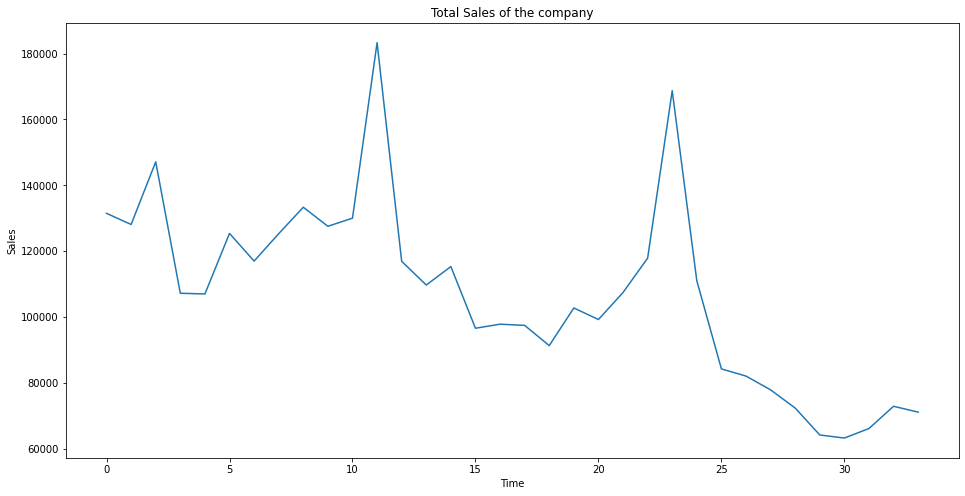

In [7]:
ts = sales.groupby(["date_block_num"])["item_cnt_day"].sum()
ts.astype('float')
plt.figure(figsize=(16,8))
plt.title('Total Sales of the company')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.plot(ts);

In [8]:
ts.head()

date_block_num
0    131479.0
1    128090.0
2    147142.0
3    107190.0
4    106970.0
Name: item_cnt_day, dtype: float64

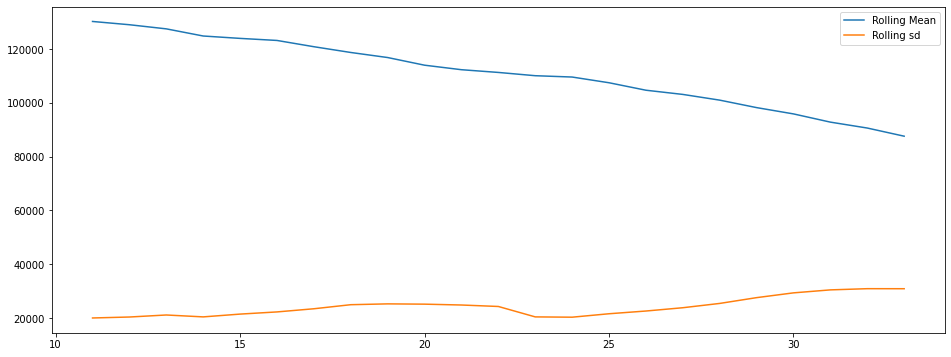

In [9]:
plt.figure(figsize=(16,6))
plt.plot(ts.rolling(window=12,center=False).mean(),label='Rolling Mean');
plt.plot(ts.rolling(window=12,center=False).std(),label='Rolling sd');
plt.legend();

__Observation__:There is an obvious "seasonality" (Eg: peak sales around a time of year) and a decreasing "Trend".
Let's check that with a quick decomposition into Trend, seasonality and residuals.

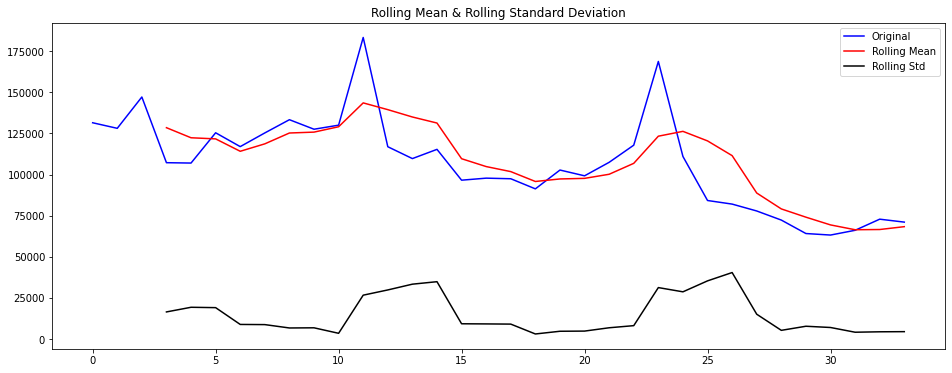

In [10]:
rolling_mean = ts.rolling(window = 4).mean()
rolling_std = ts.rolling(window = 4).std()
plt.figure(figsize=(16,6))
plt.plot(ts, color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

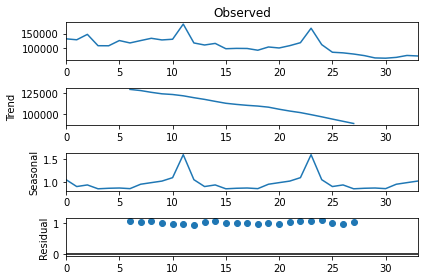

In [11]:
import statsmodels.api as sm
# multiplicative
res = sm.tsa.seasonal_decompose(ts.values,freq=12,model="multiplicative")
#plt.figure(figsize=(16,12))
fig = res.plot()
#fig.show()

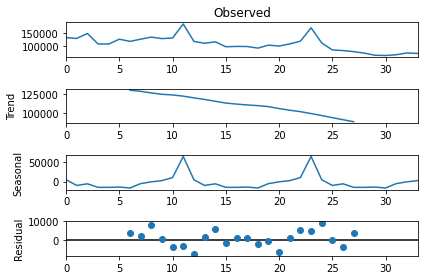

In [12]:
# Additive model
res = sm.tsa.seasonal_decompose(ts.values,freq=12,model="additive")
#plt.figure(figsize=(16,12))
fig = res.plot()
#fig.show()

we assume an additive model, then we can write

$$y(t)=S(t)+T(t)+\epsilon(t)$$

where yt is the data at period t, St is the seasonal component at period t, Tt is the trend-cycle component at period tt and Et is the remainder (or irregular or error) component at period t Similarly for Multiplicative model,
$$y(t)=S(t) \times T(t) \times \epsilon(t)$$

### Stationarity
What does it mean for data to be stationary?
1. The mean of the series should not be a function of time.
2. The variance of the series should not be a function of time (The varying of data not spread over time).
3. The covariance of the ith term and the (i+m)th term should not be a function of time.

Stationarity refers to time-invariance of a series. It means that two points in a time series are related to each other by only how far apart they are, and not by the direction (forward/backward). This is a necessary condition for building time series model. The concept of stationarity is a mathematical idea constructed to simplify the theoretical and practical development of stochastic processes. 

__Weakly Stationary__: For practical applications, the assumption of strong stationarity is not always needed. A stochastic process is said to be Weakly Stationary of order $k$ if the statistical moments of the process up to that order depend only on time differences and not upon the time of occurrences of the data being used to estimate the moments. For example a stochastic process ${x(t),t = 0,1, 2,...}$ is second order stationary if it has time independent mean and variance and the covariance values $Cov(x_{t}, x_{t−s})$ depend only on s.

There are multiple tests that can be used to check stationarity:

1. ADF (Augmented Dicky Fuller Test)
2. KPSS
3. PP (Phillips-Perron test)

I used ADF which is the most commonly used one. Mathematical tests like Dickey and Fuller are generally used to detect stationarity in a time series data. Usually time series, showing trend or seasonal patterns are non-stationary in nature. In such cases, differencing and power transformations are often used to remove the trend and to make the series stationary.

* __Dickey Fuller Test of Stationarity__: One of the statistical tests for checking stationarity. Here the null hypothesis is that the TS is non-stationary. The test results comprise of a Test Statistic and some Critical Values for difference confidence levels. If the _‘Test Statistic’_ is less than the _‘Critical Value’_, we can reject the null hypothesis and say that the series is stationary. Below we have to test if $\rho – 1$ is significantly different than zero or not. If the null hypothesis gets rejected, we’ll get a stationary time series.
$$x(t) = \rho \times x(t-1) + \epsilon(t)$$
$$x(t) - x(t-1) = (\rho-1) \times x(t-1) + \epsilon(t)$$

* __Model Parsimony Principle__: According to this principle, which is similar to similar to the Occam’s razor principle, always the model with smallest possible number of parameters is to be selected so as to provide an adequate representation of the underlying time series data. The more complicated the model, the more possibilities will arise for departure from the actual model assumptions. Also, the increase of model parameters increases the risk of overfitting.

### ADF( Augmented Dicky Fuller Test) 

In [13]:
# Stationarity tests
def test_stationarity(timeseries):
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

test_stationarity(ts)

Results of Dickey-Fuller Test:
Test Statistic                 -2.395704
p-value                         0.142953
#Lags Used                      0.000000
Number of Observations Used    33.000000
Critical Value (1%)            -3.646135
Critical Value (5%)            -2.954127
Critical Value (10%)           -2.615968
dtype: float64


In [14]:
# to remove trend
from pandas import Series as Series
# create a differenced series
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)

# invert differenced forecast
def inverse_difference(last_ob, value):
    return value + last_ob

[]

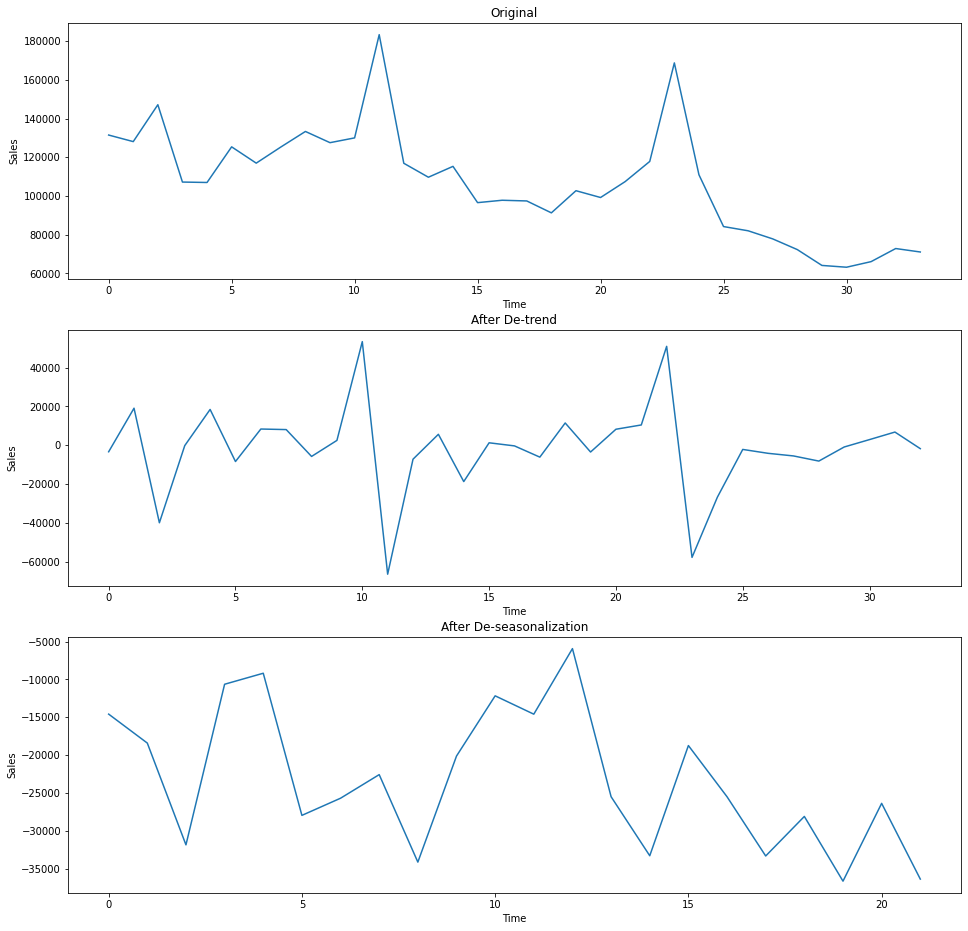

In [15]:
ts=sales.groupby(["date_block_num"])["item_cnt_day"].sum()
ts.astype('float')
plt.figure(figsize=(16,16))
plt.subplot(311)
plt.title('Original')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.plot(ts)
plt.subplot(312)
plt.title('After De-trend')
plt.xlabel('Time')
plt.ylabel('Sales')
new_ts=difference(ts)
plt.plot(new_ts)
plt.plot()

plt.subplot(313)
plt.title('After De-seasonalization')
plt.xlabel('Time')
plt.ylabel('Sales')
new_ts=difference(ts,12)       # assuming the seasonality is 12 months long
plt.plot(new_ts)
plt.plot()

In [16]:
# now testing the stationarity again after de-seasonality
test_stationarity(new_ts)

Results of Dickey-Fuller Test:
Test Statistic                 -3.270101
p-value                         0.016269
#Lags Used                      0.000000
Number of Observations Used    21.000000
Critical Value (1%)            -3.788386
Critical Value (5%)            -3.013098
Critical Value (10%)           -2.646397
dtype: float64


Now after the transformations, our p-value for the DF test is well within 5 %. Hence we can assume Stationarity of the series
We can easily get back the original series using the inverse transform function that we have defined above.

Now let's dive into making the forecasts!

### Traditional Forecasting
Here is the process:
1. Visualize the time series
2. Stationarize the series
3. Plot ACF/PACF charts and find optimal paramters
4. Build the ARIMA model
5. Make Prediction

__Linear vs. non-linear models__: A time series model is said to be linear or non-linear depending on whether the current value of the series is a linear or non-linear function of past observations.
$$x_{t} = \sum_{j=1}^{p}a_{j}x_{t-j}+\epsilon_{t}$$

Linear models: Autoregressive (AR) & Moving Average (MA) → combining these two leads to ARMA and Autoregressive Fractionally Integrated Moving Average (ARFIMA). Seasonal ARIMA or SARIMA is used for seasonal time series forecasting.

Box-Jenkins principle
ARIMA and its derivate models are based on this principle.
The Box-Jenkins Model forecasts data using three principles,
* __autoregression (p)__: tests the data for its level of stationarity.
* __differencing__: If the data being used is non-stationary it will need to be differenced (d).
* __moving average__: The data is also tested for its moving average fit which is done in part q of the analysis process.
These three principles are known as p, d and q respectively. Each principle is used in the Box-Jenkins analysis and together they are collectively shown as ARIMA (p, d, q).
Overall, initial analysis of the data prepares it for forecasting by determining the parameters (p, d and q) which are applied to develop a forecast.
ARMA = AR(p) + MA(q)
suitable for univariate time-forecasting
AR or MA are not applicable on non-stationary series
AR(p)
$$x_{t}=c+\sum_{j=1}^{p}a_{j}x_{t-j}+\epsilon_{t}$$
The integer p is the order of the model.
c is sometimes omitted for simplicity
MA(q):
Just as an AR(p) model regress against past values of the series, an
MA(q) model uses past errors as the explanatory variables.
$$x_{t}=\mu+\sum_{j=1}^{q}b_{j}\epsilon_{t-j}+\epsilon_{t}$$
μ is mean of the series.
q is order of the model.
Conceptually a moving average model is a linear regression of the current observation of the time series against the random shocks (error terms) of one or more prior observations
AR vs. MA: the primary difference between an AR and MA model is based on the correlation between time series objects at different time points. The correlation between x(t) and x(t-n) for n > order of MA is always zero. However, in the AR models the correlation of x(t) and x(t-n) gradually declines with n becoming larger.
$\epsilon_{i}$: error terms
The error terms or random shocks are assumed to be a white noise
process, i.e. a sequence of independent and identically distributed (i.i.d)
random variables with zero mean and a constant variance $\epsilon^{2}$.
Generally, the random shocks are assumed to follow the typical normal distribution.
ARMA(p,q): $$x_{t}=c+\epsilon_{t}+\sum_{j=1}^{p}a_{j}x_{t-j}+\sum_{j=1}^{q}b_{j}\epsilon_{t-j}$$

ARMA stationary condition depends on AR as MA is always stationary.
ARIMA: ARMA can be used for stationary time series only.
Time series that contain trend and seasonal patterns are non-stationary in nature making ARMA models non-adequate.
ARIMA makes the non-stationary models stationary by applying finite differencing of the data points.
The integer d controls the level of differencing. Generally d=1 is enough in
most cases. When d=0, then it reduces to an ARMA(p,q) model.
SARIMA
ARIMA works for non-stationary non-seasonal data.
In SARIMA seasonal differencing of appropriate order is used to remove non-stationarity from the series. A first order seasonal difference is the difference between an observation and the corresponding observation from the previous year and is calculated as $z_{t}=x_{t}-x_{t-s}$. For monthly time series s = 12 and for quarterly time series s = 4.
Measuring forecast performance
The common measures in linear regression can be used.

### AR, MA and ARMA models:

ARIMA is a model which is used for predicting future trends on a time series data. It is model that form of regression analysis.

* AR (Autoregression): Model that shows a changing variable that regresses on its own lagged/prior values.
* I (Integrated): Differencing of raw observations to allow for the time series to become stationary
* MA (Moving average): Dependency between an observation and a residual error from a moving average model
For ARIMA models, a standard notation would be ARIMA with p, d, and q, where integer values substitute for the parameters to indicate the type of ARIMA model used.

* p: the number of lag observations in the model; also known as the lag order.
* d: the number of times that the raw observations are differenced; also known as the degree of differencing.
* q: the size of the moving average window; also known as the order of the moving average.

In the domain of machine learning, there is a collection techniques for manipulating and interpreting variables that depend on time. Among these include ARIMA which can remove the trend component in order to accurately predict future values.

Now, How do we find out, if our time-series in AR process or MA process?

Let's find out!

In [17]:
def tsplot(y, lags=None, figsize=(10, 8), style='bmh',title=''):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        #mpl.rcParams['font.family'] = 'Ubuntu Mono'
        layout = (3, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        qq_ax = plt.subplot2grid(layout, (2, 0))
        pp_ax = plt.subplot2grid(layout, (2, 1))
        
        y.plot(ax=ts_ax)
        ts_ax.set_title(title)
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5)
        sm.qqplot(y, line='s', ax=qq_ax)
        qq_ax.set_title('QQ Plot')        
        scs.probplot(y, sparams=(y.mean(), y.std()), plot=pp_ax)

        plt.tight_layout()
    return 

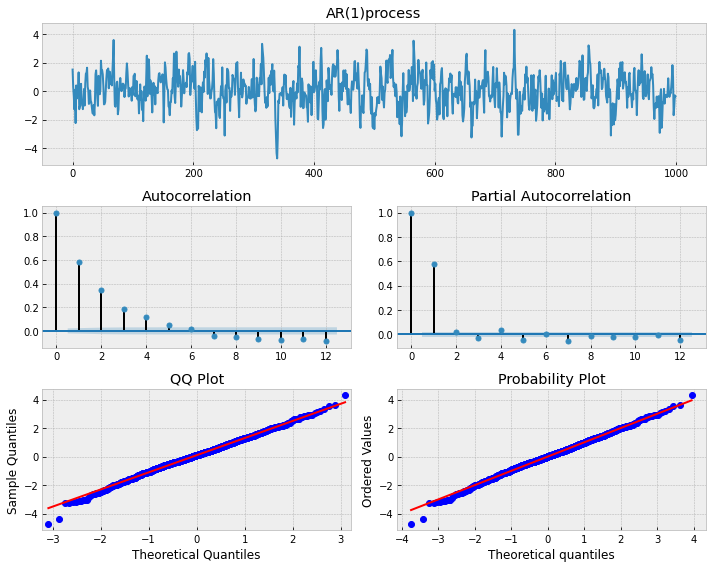

In [18]:
# Simulate an AR(1) process with alpha = 0.6
np.random.seed(1)
n_samples = int(1000)
a = 0.6
x = w = np.random.normal(size=n_samples)

for t in range(n_samples):
    x[t] = a*x[t-1] + w[t]
limit=12    
_ = tsplot(x, lags=limit,title="AR(1)process")

AR(1) process -- has ACF tailing out and PACF cutting off at lag=1

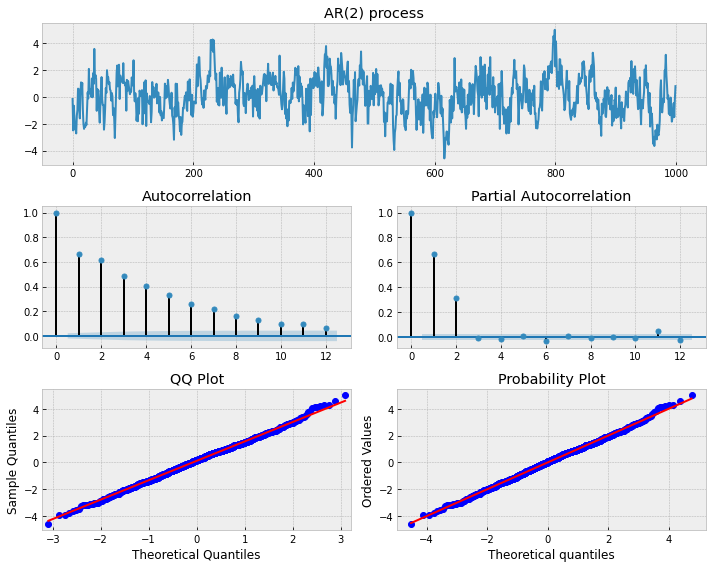

In [19]:
# Simulate an AR(2) process

n = int(1000)
alphas = np.array([.444, .333])
betas = np.array([0.])

# Python requires us to specify the zero-lag value which is 1
# Also note that the alphas for the AR model must be negated
# We also set the betas for the MA equal to 0 for an AR(p) model
# For more information see the examples at statsmodels.org
ar = np.r_[1, -alphas]
ma = np.r_[1, betas]

ar2 = smt.arma_generate_sample(ar=ar, ma=ma, nsample=n) 
_ = tsplot(ar2, lags=12,title="AR(2) process")

AR(2) process -- has ACF tailing out and PACF cutting off at lag=2

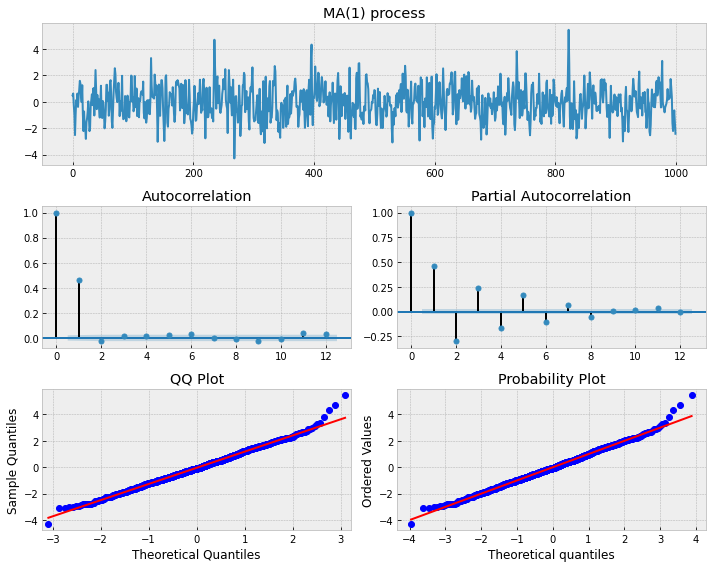

In [20]:
# Simulate an MA(1) process
n = int(1000)
# set the AR(p) alphas equal to 0
alphas = np.array([0.])
betas = np.array([0.8])
# add zero-lag and negate alphas
ar = np.r_[1, -alphas]
ma = np.r_[1, betas]
ma1 = smt.arma_generate_sample(ar=ar, ma=ma, nsample=n) 
limit=12
_ = tsplot(ma1, lags=limit,title="MA(1) process")

MA(1) process -- has ACF cut off at lag=1

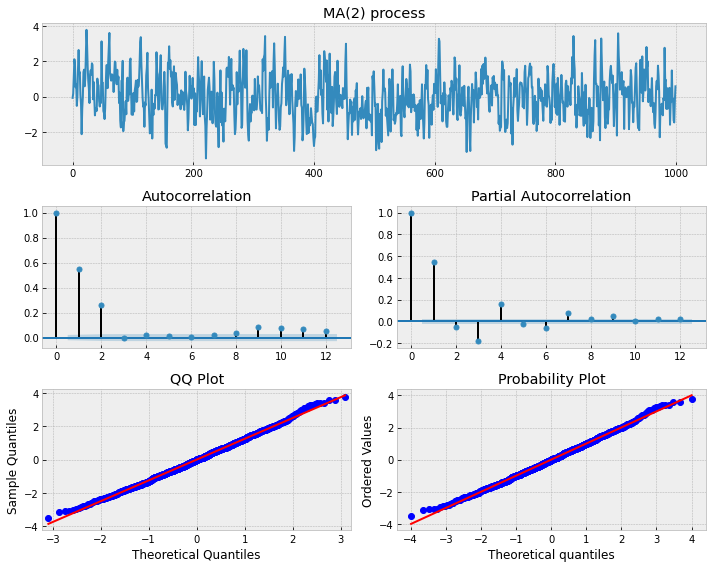

In [21]:
# Simulate MA(2) process with betas 0.6, 0.4
n = int(1000)
alphas = np.array([0.])
betas = np.array([0.6, 0.4])
ar = np.r_[1, -alphas]
ma = np.r_[1, betas]

ma3 = smt.arma_generate_sample(ar=ar, ma=ma, nsample=n)
_ = tsplot(ma3, lags=12,title="MA(2) process")

MA(2) process -- has ACF cut off at lag=2

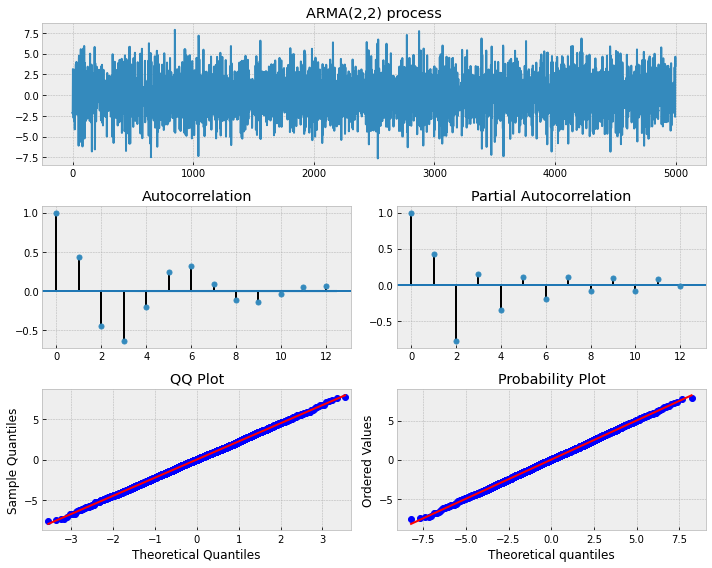

In [22]:
# Simulate an ARMA(2, 2) model with alphas=[0.5,-0.25] and betas=[0.5,-0.3]
max_lag = 12

n = int(5000) # lots of samples to help estimates
burn = int(n/10) # number of samples to discard before fit

alphas = np.array([0.8, -0.65])
betas = np.array([0.5, -0.7])
ar = np.r_[1, -alphas]
ma = np.r_[1, betas]

arma22 = smt.arma_generate_sample(ar=ar, ma=ma, nsample=n, burnin=burn)
_ = tsplot(arma22, lags=max_lag,title="ARMA(2,2) process")

Now things get a little hazy. Its not very clear/straight-forward.
A nifty summary of the above plots:

| ACF Shape	| Indicated Model |
| :- | -: |
| Exponential, decaying to zero |	Autoregressive model. Use the partial autocorrelation plot to identify the order of the autoregressive model |
| Alternating positive and negative, decaying to zero Autoregressive model.	Use the partial autocorrelation plot to help identify the order. |	
| One or more spikes, rest are essentially zero |	Moving average model, order identified by where plot becomes zero. |	
| Decay, starting after a few lags	| Mixed autoregressive and moving average (ARMA) model.	|
| All zero or close to zero |	Data are essentially random. |	
| High values at fixed intervals |	Include seasonal autoregressive term. |	
| No decay to zero	| Series is not stationary 	

Let's use a systematic approach to finding the order of AR and MA processes.

In [23]:
# pick best order by aic 
# smallest aic value wins
best_aic = np.inf 
best_order = None
best_mdl = None

rng = range(5)
for i in rng:
    for j in rng:
        try:
            tmp_mdl = smt.ARMA(arma22, order=(i, j)).fit(method='mle', trend='nc')
            tmp_aic = tmp_mdl.aic
            if tmp_aic < best_aic:
                best_aic = tmp_aic
                best_order = (i, j)
                best_mdl = tmp_mdl
        except: continue


print('aic: {:6.5f} | order: {}'.format(best_aic, best_order))

aic: 15326.68109 | order: (2, 2)


We've correctly identified the order of the simulated process as ARMA(2,2).
Lets use it for the sales time-series.

In [24]:
#
# pick best order by aic 
# smallest aic value wins
best_aic = np.inf 
best_order = None
best_mdl = None

rng = range(5)
for i in rng:
    for j in rng:
        try:
            tmp_mdl = smt.ARMA(new_ts.values, order=(i, j)).fit(method='mle', trend='nc')
            tmp_aic = tmp_mdl.aic
            if tmp_aic < best_aic:
                best_aic = tmp_aic
                best_order = (i, j)
                best_mdl = tmp_mdl
        except: continue


print('aic: {:6.5f} | order: {}'.format(best_aic, best_order))

aic: 472.99703 | order: (1, 1)


### Simply use best_mdl.predict() to predict the next values

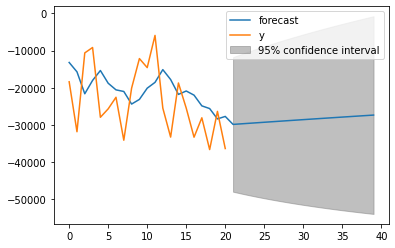

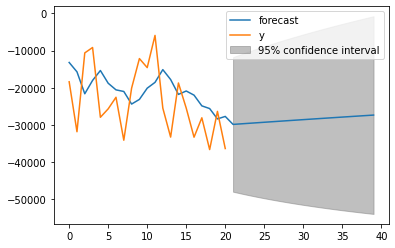

In [25]:
best_mdl.plot_predict(1,40)

In [26]:
# adding the dates to the Time-series as index
ts=sales.groupby(["date_block_num"])["item_cnt_day"].sum()
ts.index=pd.date_range(start = '2013-01-01',end='2015-10-01', freq = 'MS')
ts=ts.reset_index()
ts.head()

,index,item_cnt_day
0,2013-01-01,131479.0
1,2013-02-01,128090.0
2,2013-03-01,147142.0
3,2013-04-01,107190.0
4,2013-05-01,106970.0


### Prophet

__Prophet__: Facebook's research team has come up with an easier implementation of forecasting through it's new library called Prophet. Facebook's prophet is an approachable way for using advanced concepts for time series forecasting and us Python users, can easily relate to this library since it uses Scikit-Learn's api (Similar to Scikit-Learn). It's a very promising tool, that is often a very handy and quick solution to the frustrating flatline. Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well. In its essence, Prophet library utilizes the additive regression model.

Prophet works best when:
* Hourly, daily, or weekly observations with at least a few months (preferably a year) of history
* Strong multiple "human-scale" seasonalities: day of week and time of year
* Important holidays that occur at irregular intervals that are known in advance (e.g. the Super Bowl)
* A reasonable number of missing observations or large outliers
* Historical trend changes, for instance due to product launches or logging changes
* Trends that are non-linear growth curves, where a trend hits a natural limit or saturates

Sure, one could argue that with proper pre-processing and carefully tuning the parameters above better forecast would happened. But the truth is that most of us don't either have the patience or the expertise to make it happen. Also, there is the fact that in most practical scenarios- there is often a lot of time-series that needs to be predicted. Sometimes we need to predict multi level combinations which could be in the thousands.(ie) predict 1000s of parameters!

In [27]:
from fbprophet import Prophet
#prophet reqiures a pandas df at the below config 
# ( date column named as DS and the value column as Y)
ts.columns=['ds','y']
model = Prophet( yearly_seasonality=True) #instantiate Prophet with only yearly seasonality as our data is monthly 
model.fit(ts) #fit the model with your dataframe

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [28]:
# predict for five months in the furure and MS - month start is the frequency
future = model.make_future_dataframe(periods = 15, freq = 'MS')  

# now lets make the forecasts
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
44,2016-09-01,38214.609496,34388.645257,42136.103291
45,2016-10-01,33905.676617,30051.347546,37704.506767
46,2016-11-01,31890.319472,27787.453419,35751.410084
47,2016-12-01,90549.521473,86393.261744,95079.376010
48,2017-01-01,12121.271925,7731.440892,16680.101206


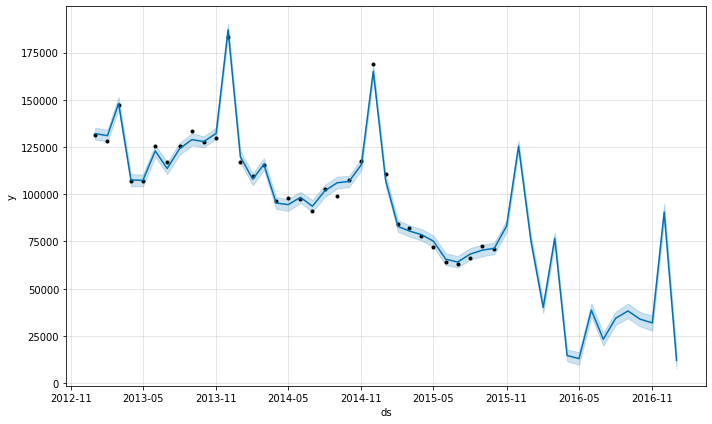

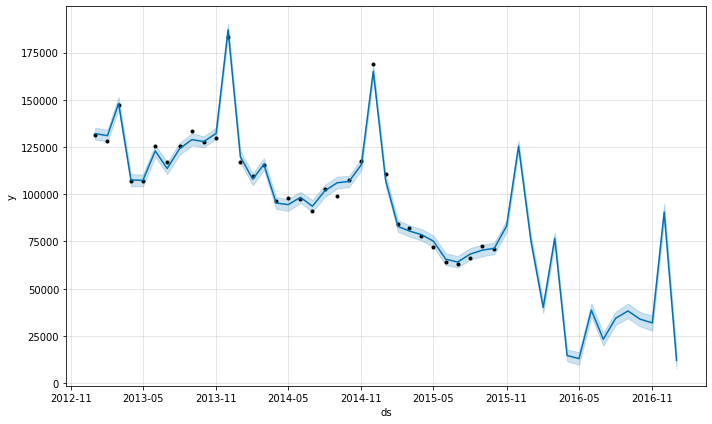

In [29]:
model.plot(forecast)

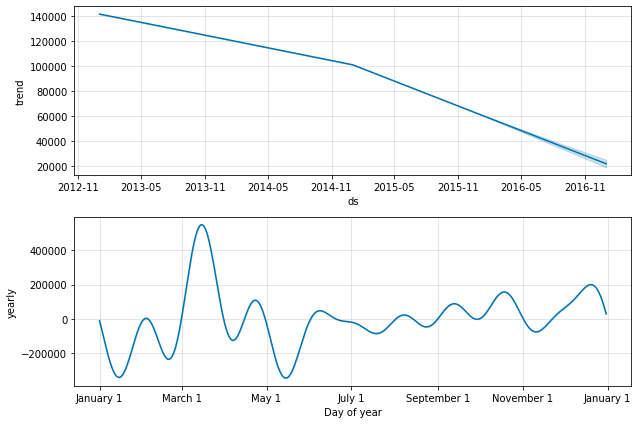

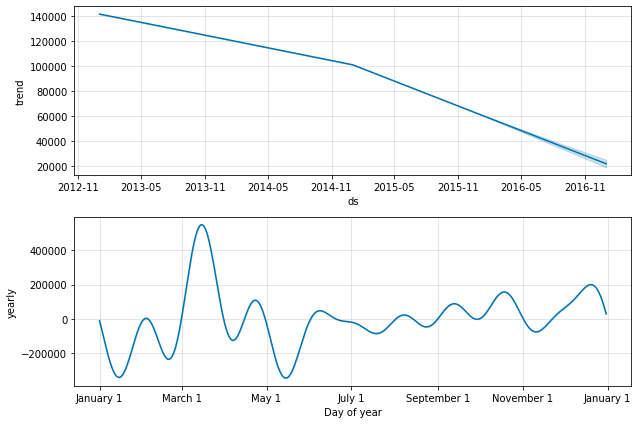

In [30]:
model.plot_components(forecast)

In [31]:
# Python
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

Awesome. The trend and seasonality from Prophet look similar to the ones that we had earlier using the traditional methods.

### Summary
__I like Prophet more! What do you think?__

In my opinion, Prophet works best with datasets that are higely influenced by seasonality (electricity bills, restaurant visitors etc.) However, I wanted to show the simplicity of using Prophet for simple forecasting which is the main aim of this kernel.

#### Following was my face when I finished this kernel and learned, actually it is fair to compare prophet with SARIMA. So if SARIMA has been added, it means I added it in following mood!

In [32]:
from IPython.display import Image
Image(url='finished.gif')   

### SARIMA
SARIMA stands for Seasonal Auto Regressive Integrated Moving Average.

* __SAR(p)__ is the seasonal autoregression of the series.

* __I(d)__ is the differencing part, the $d$ parameter tells how many differencing orders are going to be used, it tries to make the series stationary.

* __SMA(q)__ stands for moving average model, the $q$ is the number of lagged forecast errors terms in the prediction equation.

In [292]:
# Reading and transforming the file
#cities = pd.read_csv('GlobalLandTemperaturesByCity.csv')
#rio = cities.loc[cities['City'] == 'Rio De Janeiro', ['dt','AverageTemperature']]
#rio.columns = ['Date','Temp']
#rio['Date'] = pd.to_datetime(rio['Date'])
#rio.reset_index(drop=True, inplace=True)
#rio.set_index('Date', inplace=True)

#I'm going to consider the temperature just from 1900 until the end of 2012
#rio = rio.loc['1900':'2013-01-01']
#rio = rio.asfreq('M', method='bfill')
#rio.head()
#rio.to_csv('Data_2.csv', encoding='utf-8')
rio = pd.read_csv('Data_2.csv')
rio.reset_index(drop=True, inplace=True)
rio.set_index('Date', inplace=True)
rio.head()


,Temp
Date,
1900-01-31,25.780
1900-02-28,26.160
1900-03-31,23.868
1900-04-30,23.467
1900-05-31,22.667


Now, let's see how this series behaves

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


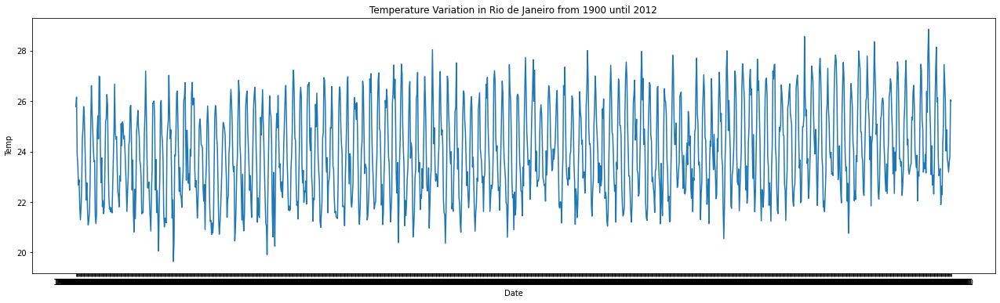

In [293]:
plt.figure(figsize=(22,6))
sns.lineplot(x=rio.index, y=rio['Temp'])
plt.title('Temperature Variation in Rio de Janeiro from 1900 until 2012')
plt.show()

The series clearly has some seasonality, the higher temperatures are around November and February and the lower are between July and September. Just to make the things clear, I'll merge these lines into just one line, averaging the monthly levels:

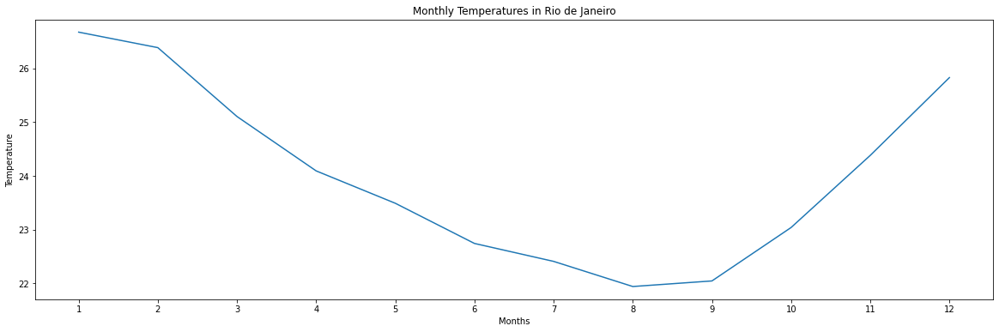

In [294]:
monthly_seasonality = pivot.mean(axis=1)
monthly_seasonality.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Rio de Janeiro')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.show()

Now i'm going to check if there is some trend through the years in this Series:

We can confirm that there is a constant increasing trend and that the average temperature increased from 23.5º to 24.5º, that's 4.25% in over100 years.

Before we go on, i'm going to split the data in training, validation and test set. After training the model, I will use the last 5 years to do the data validation and test, being 48 months to do a month by month validation (walk forward) and 12 months to make an extrapolation for the future and compare to the test set:

In [295]:
train = rio[:-60].copy()
val = rio[-60:-12].copy()
test = rio[-12:].copy()

And before creating the forecasts we will create a baseline forecast in the validation set, in our simulation we will try to have a smaller error compared to this one.

it will consider the previous month as a base forecast to the next month:

In [299]:
# Excluding the first line, as it has NaN values
baseline = val['Temp'].shift()
baseline.dropna(inplace=True)
baseline.head()

Date
2008-02-29    26.362
2008-03-31    26.631
2008-04-30    25.793
2008-05-31    24.031
2008-06-30    23.713
Name: Temp, dtype: float64

Also I'm going to create a function to use the RMSE as a base to calculate the error, but you are free to use another parameter:

In [300]:
def measure_rmse(y_true, y_pred):
    return sqrt(mean_squared_error(y_true,y_pred))

# Using the function with the baseline values
rmse_base = measure_rmse(val.iloc[1:,0],baseline)
print(f'The RMSE of the baseline that we will try to diminish is {round(rmse_base,4)} celsius degrees')

The RMSE of the baseline that we will try to diminish is 1.3282 celsius degrees


As we can see, the series has a small uptrend and it appears that there is some seasonality with higher temperatures at the begining and end of the year and lower temperatures around the middle of the year.

To create a time series forecast, the series must be stationary (constant mean, variance and autocorrelation).

One way to check if the series is stationary is using the adfuller function, if the P-Value is lower than 5% (usual number used for this kind of study) the series is stationary and you can start creating your model.

If the series isn't stationary you can do some data transformation like using natural logarithm, deflation, differencing, etc.

Below is the function that I used to check the stationarity, it plots:

* The series itself;
* The autocorrelation function (ACF):
    * It shows the correlation between the current temperatures versus the lagged versions of itself.
* The partial autocorrelation (PACF):
    * It shows the correlation between the current temperatures versus the lagged version excluding the effects of earlier lags, for example, it show the effective influence of the lag 3 in the current temperatures excluding the effects of the lags 1 and 2.
For more interesting sources you can read the materials on this amazing website made by Mr. Robert Nau: Duke University, also you can check Jason Brownlee's website, which have a lot of time series content.

In [301]:
def check_stationarity(y, lags_plots=48, figsize=(22,8)):
    "Use Series as parameter"
    
    # Creating plots of the DF
    y = pd.Series(y)
    fig = plt.figure()

    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=2)
    ax2 = plt.subplot2grid((3, 3), (1, 0))
    ax3 = plt.subplot2grid((3, 3), (1, 1))
    ax4 = plt.subplot2grid((3, 3), (2, 0), colspan=2)

    y.plot(ax=ax1, figsize=figsize)
    ax1.set_title('Rio de Janeiro Temperature Variation')
    plot_acf(y, lags=lags_plots, zero=False, ax=ax2);
    plot_pacf(y, lags=lags_plots, zero=False, ax=ax3);
    sns.distplot(y, bins=int(sqrt(len(y))), ax=ax4)
    ax4.set_title('Distribution Chart')

    plt.tight_layout()
    
    print('Results of Dickey-Fuller Test:')
    adfinput = adfuller(y)
    adftest = pd.Series(adfinput[0:4], index=['Test Statistic','p-value','Lags Used','Number of Observations Used'])
    adftest = round(adftest,4)
    
    for key, value in adfinput[4].items():
        adftest["Critical Value (%s)"%key] = value.round(4)
        
    print(adftest)
    
    if adftest[0].round(2) < adftest[5].round(2):
        print('\nThe Test Statistics is lower than the Critical Value of 5%.\nThe serie seems to be stationary')
    else:
        print("\nThe Test Statistics is higher than the Critical Value of 5%.\nThe serie isn't stationary")

Results of Dickey-Fuller Test:
Test Statistic                   -3.7599
p-value                           0.0033
Lags Used                        23.0000
Number of Observations Used    1272.0000
Critical Value (1%)              -3.4355
Critical Value (5%)              -2.8638
Critical Value (10%)             -2.5680
dtype: float64

The Test Statistics is lower than the Critical Value of 5%.
The serie seems to be stationary


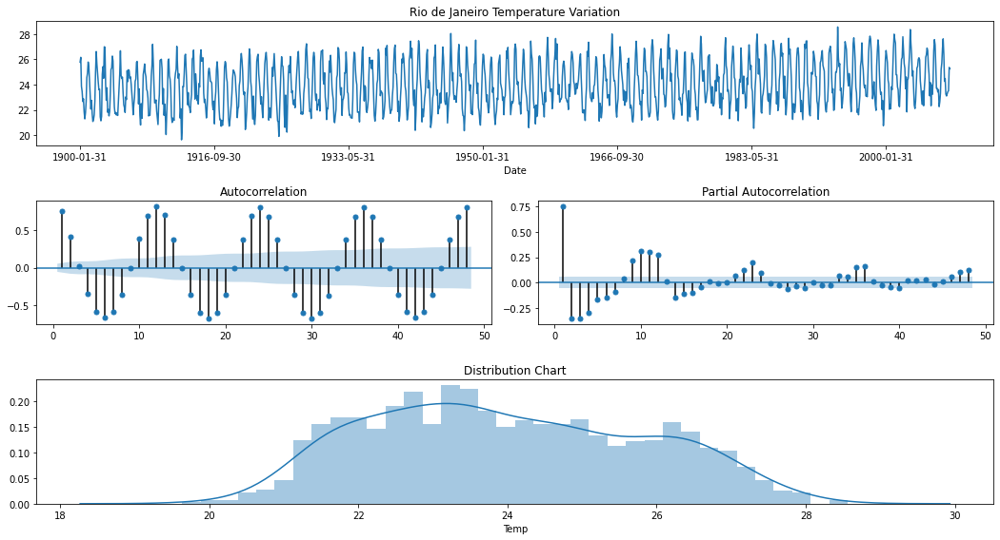

In [302]:
# The first approach is to check the series without any transformation
check_stationarity(train['Temp'])

The series has an interesting behavior, there is a sequential significative negative autocorrelation starting at lag 6 and repeating each 12 months, it's because of the difference in the seasons, if today is winter with cold temperatures in 6 months we will have higher temperatures in the summer, that's why the negative autocorrelation occurs. These temperatures usually walk in opposite directions.

Also, from lag 12 and sequentially from every 12 lags there is a significant positive autocorrelation. The PACF shows a positive spike in the first lag and a drop to negative PACF in the following lags.

This behavior between the ACF and PACF plots suggests an AR(1) model and also a first seasonal difference ( Yt−Yt−12 ). I'll plot the stationarity function again with the first seasonal difference to see if we will need some SAR(P) or SMA(Q) parameter:

Results of Dickey-Fuller Test:
Test Statistic                  -13.4631
p-value                           0.0000
Lags Used                        23.0000
Number of Observations Used    1260.0000
Critical Value (1%)              -3.4356
Critical Value (5%)              -2.8638
Critical Value (10%)             -2.5680
dtype: float64

The Test Statistics is lower than the Critical Value of 5%.
The serie seems to be stationary


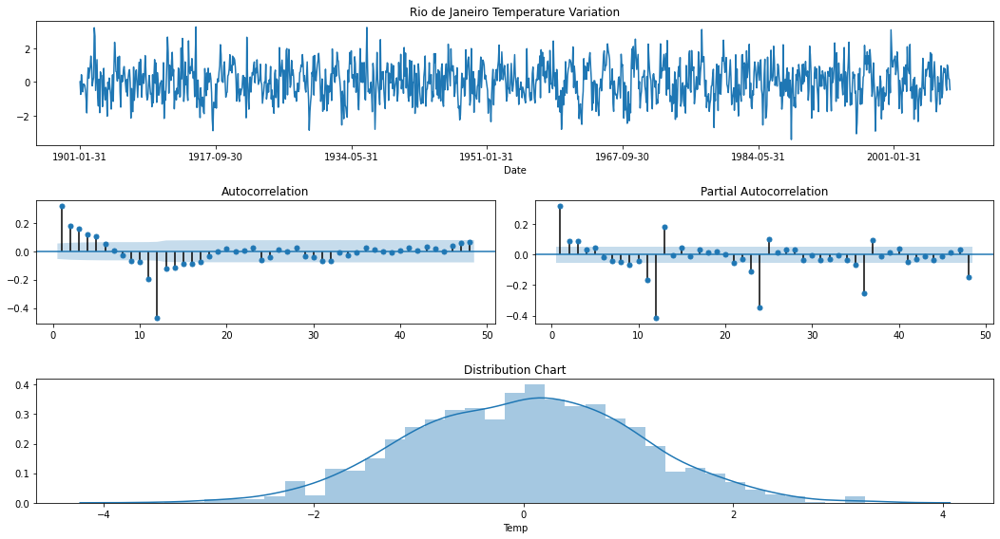

In [303]:
check_stationarity(train['Temp'].diff(12).dropna())

As the plots above showed, the first ACF lags have a gradual decay, while the PACF drops under the confidence interval after the third lag, this is an AR signature with a parameter of 3, so this is an AR(3) model.

As we used a first seasonal difference, the ACF and PACF showed a significative drop in the 12th lag, it means an SMA signature with a parameter of 1 lag, resuming this is an SAR(1) with a first difference.

Initially i'm going to work with the following (p,d,q) orders: (3, 0, 0), and with the following seasonal (P, D, Q, S) orders (0,1,1,12) and as the series has a clear uptrend i'm going to use it in the model ('c').

To start forecasting the validation set, I'm going to create a function to use one-step-forecast in the whole validation set and measure the error:

In [304]:
def walk_forward(training_set, validation_set, params):
    '''
    Params: it's a tuple where you put together the following SARIMA parameters: ((pdq), (PDQS), trend)
    '''
    history = [x for x in training_set.values]
    prediction = list()
    
    # Using the SARIMA parameters and fitting the data
    pdq, PDQS, trend = params

    #Forecasting one period ahead in the validation set
    for week in range(len(validation_set)):
        model = sm.tsa.statespace.SARIMAX(history, order=pdq, seasonal_order=PDQS, trend=trend)
        result = model.fit(disp=False)
        yhat = result.predict(start=len(history), end=len(history))
        prediction.append(yhat[0])
        history.append(validation_set[week])
        
    return prediction

In [305]:
# Let's test it in the validation set
val['Pred'] = walk_forward(train['Temp'], val['Temp'], ((3,0,0),(0,1,1,12),'c'))

In [306]:
# Measuring the error of the prediction
rmse_pred = measure_rmse(val['Temp'], val['Pred'])

print(f"The RMSE of the SARIMA(3,0,0),(0,1,1,12),'c' model was {round(rmse_pred,4)} celsius degrees")
print(f"It's a decrease of {round((rmse_pred/rmse_base-1)*100,2)}% in the RMSE")

The RMSE of the SARIMA(3,0,0),(0,1,1,12),'c' model was 0.7874 celsius degrees
It's a decrease of -40.72% in the RMSE


In [307]:
# Creating the error column
val['Error'] = val['Temp'] - val['Pred']

It's always important to check the residuals, I'm going to create a function to plot some important charts to help us visualize the residuals.

I'm going to plot the following charts:

* Current and Predicted values through the time.
* Residuals vs Predicted values in an scatterplot.
* QQ Plot showing the distribution of errors and its ideal distribution
* Autocorrelation plot of the Residuals to see if there is some correlation left.

In [308]:
def plot_error(data, figsize=(20,8)):
    '''
    There must have 3 columns following this order: Temperature, Prediction, Error
    '''
    plt.figure(figsize=figsize)
    ax1 = plt.subplot2grid((2,2), (0,0))
    ax2 = plt.subplot2grid((2,2), (0,1))
    ax3 = plt.subplot2grid((2,2), (1,0))
    ax4 = plt.subplot2grid((2,2), (1,1))
    
    #Plotting the Current and Predicted values
    ax1.plot(data.iloc[:,0:2])
    ax1.legend(['Real','Pred'])
    ax1.set_title('Current and Predicted Values')
    
    # Residual vs Predicted values
    ax2.scatter(data.iloc[:,1], data.iloc[:,2])
    ax2.set_xlabel('Predicted Values')
    ax2.set_ylabel('Errors')
    ax2.set_title('Errors versus Predicted Values')
    
    ## QQ Plot of the residual
    sm.graphics.qqplot(data.iloc[:,2], line='r', ax=ax3)
    
    # Autocorrelation plot of the residual
    plot_acf(data.iloc[:,2], lags=(len(data.iloc[:,2])-1),zero=False, ax=ax4)
    plt.tight_layout()
    plt.show()

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


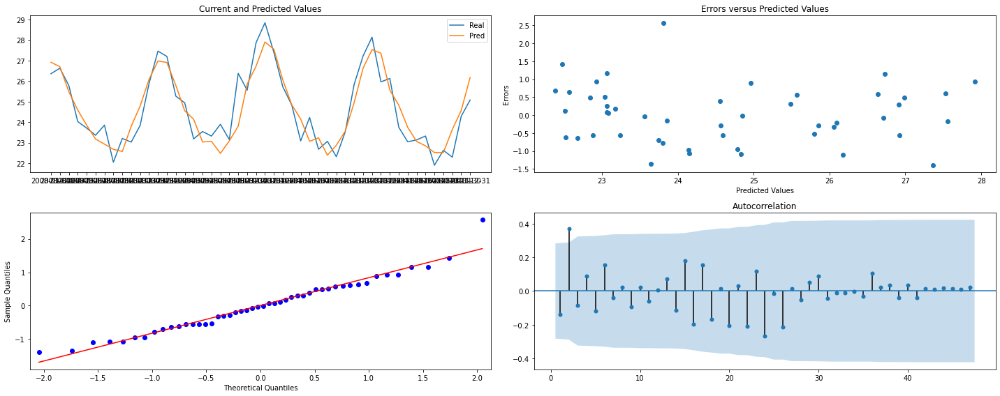

In [309]:
plot_error(val)

Analyzing the plots above we can see that the predictions fit very well on the current values.

The Error vs Predicted values has a linear distribution (the errors are between -1.5 and +1.5 while the temperature increases).

The QQ Plot shows a normal pattern with some little outliers and,

The autocorrelation plot shows a positive spike over the confidence interval just above the second lag, but I believe that there is no need for more changes.

Finally it's time to extrapolate the prediction in the test set for the last 12 months

In [315]:
#Creating the new concatenating the training and validation set:
future = pd.concat([train['Temp'], val['Temp']])
future

Date
1900-01-31    25.780
1900-02-28    26.160
1900-03-31    23.868
1900-04-30    23.467
1900-05-31    22.667
               ...  
2011-08-31    21.900
2011-09-30    22.627
2011-10-31    22.294
2011-11-30    24.287
2011-12-31    25.081
Name: Temp, Length: 1344, dtype: float64

In [311]:
# Using the same parameters of the fitted model
model = sm.tsa.statespace.SARIMAX(future, order=(3,0,0), seasonal_order=(0,1,1,12), trend='c')
result = model.fit(disp=False)


Now I'm going to create a new column on the test set with the predicted values and I will compare them against the real values

In [312]:
test['Pred'] = result.predict(start=(len(future)), end=(len(future)+13))
test['Pred']

Date
2012-01-31   NaN
2012-02-29   NaN
2012-03-31   NaN
2012-04-30   NaN
2012-05-31   NaN
2012-06-30   NaN
2012-07-31   NaN
2012-08-31   NaN
2012-09-30   NaN
2012-10-31   NaN
2012-11-30   NaN
2012-12-31   NaN
Name: Pred, dtype: float64

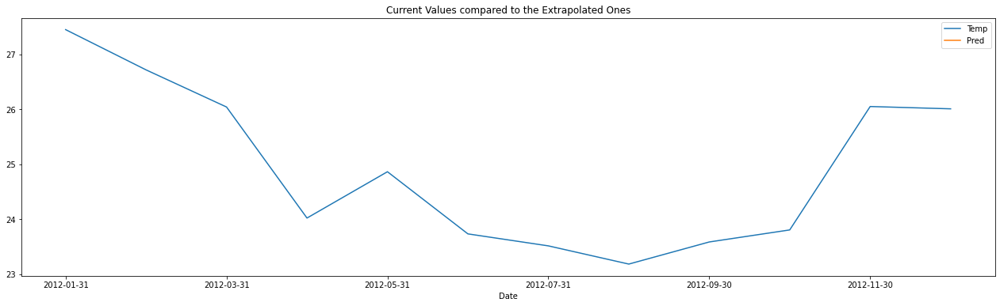

In [313]:
test[['Temp', 'Pred']].plot(figsize=(22,6))
plt.title('Current Values compared to the Extrapolated Ones')
plt.show()

It seems that the SARIMA parameters were well fitted, the predicted values are following the real values and also the seasonal pattern.

Finally I'll evaluate the model with the RMSE in the test set (baseline against the extrapolation):

In [314]:
test_baseline = test['Temp'].shift()

test_baseline[0] = test['Temp'][0]

rmse_test_base = measure_rmse(test['Temp'],test_baseline)
rmse_test_extrap = measure_rmse(test['Temp'], test['Pred'])

print(f'The baseline RMSE for the test baseline was {round(rmse_test_base,2)} celsius degrees')
print(f'The baseline RMSE for the test extrapolation was {round(rmse_test_extrap,2)} celsius degrees')
print(f'That is an improvement of {-round((rmse_test_extrap/rmse_test_base-1)*100,2)}%')

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

### Prophet

In [285]:
#rio = cities.loc[cities['City'] == 'Rio De Janeiro', ['dt','AverageTemperature']]
#rio.columns = ['Date','Temp']
#rio['Date'] = pd.to_datetime(rio['Date'])
#rio.reset_index(drop=True, inplace=True)
#rio = rio.iloc[816:2172]
rio.to_csv('Data_3.csv', encoding='utf-8')
rio = pd.read_csv('Data_3.csv')
del rio['Unnamed: 0']
rio.head()

,Date,Temp
0,1900-01-01,24.846
1,1900-02-01,25.780
2,1900-03-01,26.160
3,1900-04-01,23.868
4,1900-05-01,23.467


In [286]:
train = rio.iloc[:-12]
test = rio.iloc[-12:]

In [287]:
from fbprophet import Prophet
#prophet reqiures a pandas df at the below config 
# ( date column named as DS and the value column as Y)
train.columns=['ds','y']
model = Prophet( yearly_seasonality=True) #instantiate Prophet with only yearly seasonality as our data is monthly 
model.fit(train) #fit the model with your dataframe

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [288]:
# predict for five months in the furure and MS - month start is the frequency
future = model.make_future_dataframe(periods = 12, freq = 'MS')  

# now lets make the forecasts
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1351,2012-08-01,23.187070,22.241223,24.154922
1352,2012-09-01,22.743940,21.842116,23.779117
1353,2012-10-01,22.925356,21.967356,23.819020
1354,2012-11-01,23.808848,22.752658,24.723995
1355,2012-12-01,25.093155,24.105821,25.995881


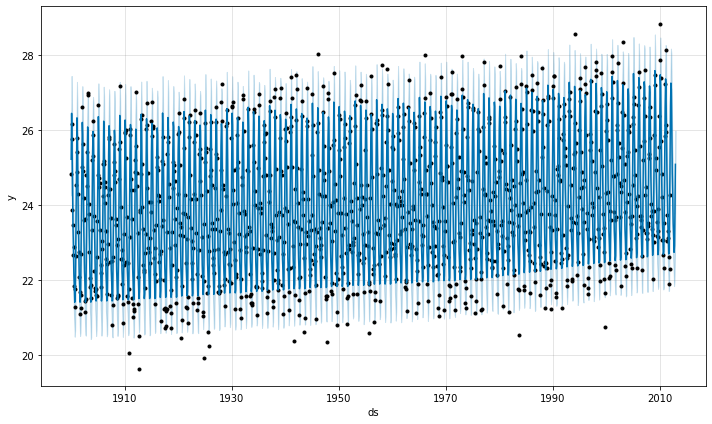

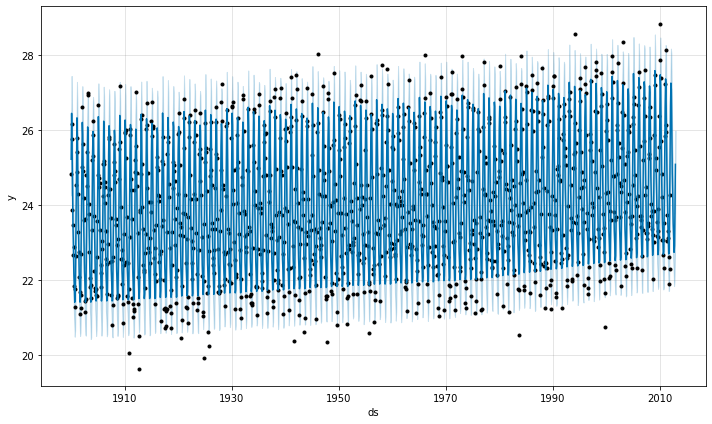

In [289]:
model.plot(forecast)

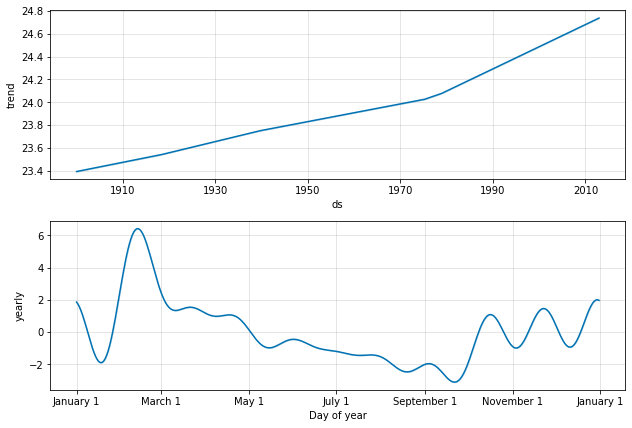

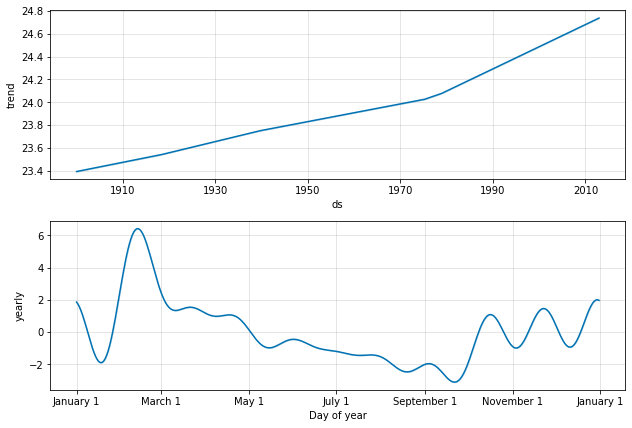

In [290]:
model.plot_components(forecast)

In [291]:
# Python
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

### Summary:
I still like Prophet more!